<a href="https://colab.research.google.com/github/Tar0kan/notebook-examples/blob/master/Model_trial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Arctic Waterbodies Segmentation Trial

## Preliminaries

Import everything necessary:

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import glob
from functools import partial

import numpy as np

import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.utils.data import random_split

import albumentations as A
!pip install segmentation-models-pytorch==0.2.1
import segmentation_models_pytorch as smp

from matplotlib import pyplot as plt
!pip install rasterio
!pip install GDAL
import rasterio
from rasterio.plot import reshape_as_image, reshape_as_raster

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 KB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 KB 8.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 KB 14.9 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12422 sha256=ab0ffe42a13a75904c17f8ed2708dd09310e98fc9975aa4abdbbb97911ef4bba
  Stored in directory: /root/.cache/pip/wheels/6b/48/d7/9a3ea4072e0d735f895d5e58f9a679903dcb4e90a55418955b
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60966 sha256=23a82ed5aff78bf05a061a0f6295909317b3174149d2d0614c9b6c2ba8c2597d
  Stored in directory: /root/.cache/pip/wheels/ed/fa/b9/5c82b59d905f95542a192b883c0cc0082407ea2f54beb2f9e6
Successfully bui

Define the customised `Dataset` class and the "Subset" version of it:

**Note**  
The "Subset" version is necessary due to PyTorch's way of splitting datasets when using the `random_split()` method. The resulting split datasets become `torch.utils.data.dataset.Subset` objects, and defer to the parent `Dataset` object for transforms or other augmentations/preprocessing attributes. To retain the ability to apply different augmentations/preprocessing to individual `Subset` instances, a separate `Dataset` class is created to wrap around the `Subset` objects, with its own augmentations/preprocessing attributes. This is a bit clunky, but keeps the rest of the code clean.

In [3]:
class ArcticWatersDataset(Dataset):
    """Constructs dataset of Arctic waterbodies and their labelling masks.
    
    The class construction reads in image-and-mask pairs from the given paths
    and apply augmentations and preprocessing if they are specified.
    
    Parameters
    ----------
    img_paths : list of str
        List of directory paths leading to each of the data images (must be 
        readable by the `rasterio` module). The order must correspond to those
        given in `msk_paths` such that each image corresponds to its mask.
    msk_paths : list of str
        List of directory paths leading to each of the data masks (must be 
        readable by the `rasterio` module). The order must correspond to those
        given in `img_paths` such that each image corresponds to its mask.
    augmentations : instance of the albumentation.Compose class
        Data augmentation pipeline that transform images (e.g. flip, transpose,
        rotate, crop, distort, brightness, contrast), composed with the
        Albumentation library.
    preprocessing : instance of the albumentation.Compose class
        Data preprocessing pipeline that transform images (e.g. normalise, type-
        convert), composed with the Albumentation library via the use of
        `albumentation.Lambda` method.
    
    """
    def __init__(self, img_paths, msk_paths, augmentations=None, preprocessing=None):
        self.img_paths = img_paths
        self.msk_paths = msk_paths
        self.augmentations = augmentations
        self.preprocessing = preprocessing
    
    def __len__(self):
        return len(self.msk_paths)
    
    def __getitem__(self, idx):
        
        # Read the image-mask pairs
        with rasterio.open(self.img_paths[idx], 'r') as img_src, rasterio.open(self.msk_paths[idx]) as msk_src:
            # Since rasterio reads images into shapes of (bands, height, width),
            # we use `reshape_as_image` to reshape it to (height, width, bands).
            image = reshape_as_image(img_src.read())
            mask = reshape_as_image(msk_src.read())
            
        # Apply augmentations
        if self.augmentations:
            augmented = self.augmentations(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']
            
        # Apply any preprocessing required for specific models
        if self.preprocessing:
            preprocessed = self.preprocessing(image=image, mask=mask)
            image, mask = preprocessed['image'], preprocessed['mask']
            
        return image, mask

In [4]:
class ArcticWaterSubset(Dataset):
    """Constructs dataset from subsets in order to retain augmentation options.
    
    The `torch.utils.data.dataset.Subset` instances resulting from the 
    `torch.utils.data.random_split` function does not retain the transform
    attributes, preventing different transformations to be applied to the 
    training, validation, and test split from the original dataset. This dummy
    class reintroduces such attributes. Note that it is best to use subsets 
    without any transformations here, and add all the transformations in this
    dummy class instead.
    
    Parameters
    ----------
    subset : torch.utils.data.dataset.Subset instance
        The subset generated by the `random_split` method.
    augmentations : instance of the albumentation.Compose class
        Data augmentation pipeline that transform images (e.g. flip, transpose,
        rotate, crop, distort, brightness, contrast), composed with the
        Albumentation library.
    preprocessing : instance of the albumentation.Compose class
        Data preprocessing pipeline that transform images (e.g. normalise, type-
        convert), composed with the Albumentation library via the use of
        `albumentation.Lambda` method.
    
    """
    def __init__(self, subset, augmentations=None, preprocessing=None):
        self.subset = subset
        self.augmentations = augmentations
        self.preprocessing = preprocessing
        
    def __len__(self):
        return len(self.subset)
    
    def __getitem__(self, idx):
        image, mask = self.subset[idx]
        
        # Apply augmentations
        if self.augmentations:
            augmented = self.augmentations(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']
            
        # Apply any preprocessing required for specific models
        if self.preprocessing:
            preprocessed = self.preprocessing(image=image, mask=mask)
            image, mask = preprocessed['image'], preprocessed['mask']
            
        return image, mask

In [5]:
# Ranging values for visualization
def scaleMinMax(x):
    return((x - np.nanmin(x))/(np.nanmax(x) - np.nanmin(x)))

Define convenience functions for
* visualisations
* bundling augmentations (separately for training and validation/testing), and 
* bundling preprocessing tasks

and any helpers or aliases required:

In [6]:
# Adopted from https://albumentations.ai/docs/examples/example_kaggle_salt/ with minor modifications
def visualize(image, mask, predicted_mask=None, original_image=None, original_mask=None, in_rows=False):
    fontsize = 18
    
    if original_image is None and original_mask is None:
        num_img = 2 + (predicted_mask is not None)
        fig_size = num_img * 8
            
        if in_rows:
            f, ax = plt.subplots(1, num_img, figsize=(fig_size, fig_size))
        else:
            f, ax = plt.subplots(num_img, 1, figsize=(fig_size, fig_size))
        
        # Extracting each array(band) to make a RGB image
        
        image_r = image[:,:,2] # red band
        image_g = image[:,:,1] # green band
        image_b = image[:,:,0] # blue band
        
        image_r = scaleMinMax(image_r)
        image_g = scaleMinMax(image_g)
        image_b = scaleMinMax(image_b)
        
        image_rgb = np.dstack((image_r,image_g,image_b))
        
        ax[0].imshow(image_rgb)
        ax[0].set_title('Image', fontsize=fontsize)
        ax[1].imshow(mask)
        ax[1].set_title('Mask', fontsize=fontsize)
        
        if predicted_mask is not None:
            ax[2].imshow(predicted_mask)
            ax[2].set_title('Predicted Mask', fontsize=fontsize)
    else:
        f, ax = plt.subplots(2, 2, figsize=(8, 8))

        original_image_r = original_image[:,:,2] # red band
        original_image_g = original_image[:,:,1] # green band
        original_image_b = original_image[:,:,0] # blue band
        
        original_image_r = scaleMinMax(original_image_r)
        original_image_g = scaleMinMax(original_image_g)
        original_image_b = scaleMinMax(original_image_b)
        
        original_image_rgb = np.dstack((original_image_r,original_image_g,original_image_b))
        
        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)
        
        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)
        
        ax[0, 1].imshow(image_rgb)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)
        
        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

I had to hide some augmentations (mostly all) because I had a problem with visualizing them. I left only horizontal and vertical flips as well as random rotate. Also, since images are now directly in 224x224 size (which would be accepted by the model without padding) there are only `padded_height = original_height` and `padded_width = original_width` left to not to loose this padding part for another possible future usage. 

In [7]:
def get_training_augmentations(original_height, original_width, n=0):
    """Get the augmentations to be applied to training data.
    
    Parameters
    ----------
    original_height : int
        The height of one sample image from the dataset without preprocessing
        or augmentations. 
    original_width : int
        The width of one sample image from the dataset without preprocessing
        or augmentations.
    n : int
        The number of maxpooling layers in the model. UNet-type architecture
        typically requires input image with width and height divisible by 2^n,
        where n is the number of maxpooling layers. Images will be padded up 
        to dimensions divisible by 2^n. Set `n=0` to ignore this. Default is
        5.
        
    Returns
    -------
    albumentations.core.composition.Compose
        The callable composition of all relevant transforms.
    
    """
    if n:
        # for 400x400 images
        #padded_height = ((original_height // 2**n) + 1) * 2**n
        #padded_width = ((original_width // 2**n) + 1) * 2**n
        
        # for 416x416 and 224x224 images
        padded_height = original_height
        padded_width = original_width
        
        
    transformations = [
        
        A.OneOf([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            ], p=0.8)]
#        A.OneOf([
#            A.PadIfNeeded(min_height=padded_height, 
#                          min_width=padded_width, 
#                          p=0.5),
#            A.RandomSizedCrop(min_max_height=(original_height // 2, original_height), 
#                              height=padded_height, 
#                              width=padded_width, 
#                              p=0.5)
#        ], p=1),
#        A.HorizontalFlip(p=0.5),
#        A.VerticalFlip(p=0.5),
#        A.RandomRotate90(p=0.5),
#        A.OneOf([
#            A.RandomBrightnessContrast(p=1),    
#            A.RandomGamma(p=1)
#        ], p=0.8)]
            
    return A.Compose(transformations)

In [8]:
def get_validation_augmentations(original_height, original_width, n=0):
    """Get the augmentations to be applied to validation/test data.
    
    Parameters
    ----------
    original_height : int
        The height of one sample image from the dataset without preprocessing
        or augmentations. 
    original_width : int
        The width of one sample image from the dataset without preprocessing
        or augmentations.
    n : int
        The number of maxpooling layers in the model. UNet-type architecture
        typically requires input image with width and height divisible by 2^n,
        where n is the number of maxpooling layers. Images will be padded up 
        to dimensions divisible by 2^n. Set `n=0` to ignore this. Default is
        5.
    
    Returns
    -------
    albumentations.core.composition.Compose
        The callable composition of all relevant transforms.
    
    """
    if n:
        
        # for 400x400 images       
        #padded_height = ((original_height // 2**n) + 1) * 2**n
        #padded_width = ((original_width // 2**n) + 1) * 2**n
        
        # for 416x416 and 224x224 images
        padded_height = original_height
        padded_width = original_width
    
    transformation = [
        A.PadIfNeeded(min_height=padded_height, 
                      min_width=padded_width, 
                      p=1)
    ]
    
    return A.Compose(transformation)

# Make an alias for test-data augmentations
get_test_augmentations = get_validation_augmentations

In [9]:
def to_tensor(x, torch_type=torch.float, reshape_fn=None, **kwargs):
    """Convert NumPy array to PyTorch Tensor of specified type.
    
    Parameters
    ----------
    x : numpy.ndarray object
        The NumPy array to be converted.
    torch_type : torch.dtype object
        The dtype into which to cast the `torch.Tensor` object. Default
        is `torch.float32`.
    reshape_fn : function
        The function used to reshape `x` before converting to a `torch.Tensor`.
        
    Returns
    -------
    torch.Tensor
        The `torch.Tensor` version of the input `x`.
    
    """ 
    if reshape_fn:
        x = reshape_fn(x)
    return torch.from_numpy(x).to(torch.float32)


# Make `to_tensor` functions with pre-filled `torch_type` field.
to_tensor_float32 = partial(to_tensor, torch_type=torch.float32, reshape_fn=reshape_as_raster)
to_tensor_uint8 = partial(to_tensor, torch_type=torch.uint8, reshape_fn=reshape_as_raster)


def get_preprocessing(preprocessing_fn=None):
    """Get the preprocessing transforms required for the pre-trained models.
    
    The process also includes conversion of images and masks from 
    `numpy.ndarray` to `torch.Tensor` with types `torch.float32` and 
    `torch.uint8`, respectively.
    
    Parameters
    ----------
    preprocessing_fn : functools.partial object from `smp.encoders.get_preprocessing_fn`
        The preprocessing required such that input is suitable for use with 
        an encoder that is pretrained. The default is None.
    
    Returns
    -------
    albumentations.core.composition.Compose
        The callable composition of all relevant transforms.
    
    """ 
    # Note: `reshape_as_raster` reshapes (height, width, bands) to
    #       (bands, height, width).
    preprocess = [
        A.Lambda(image=preprocessing_fn),
        A.Lambda(image=to_tensor_float32, mask=to_tensor_uint8)
    ]
    
    if preprocessing_fn is None:
        preprocess.pop(0)
    
    return A.Compose(preprocess)

## Data setup and visualisations

Images (Sentinel-2) have 4 bands in following order:

* Band 1 - B8 Near IR
* Band 2 - B12 Short Wave IR (**Note**: originally B12 and B11 (used to calculate TCW) in 20 m resolution but was downloaded with 10 m resolution directly from GEE without actually increasing resolution)
* Band 3 - SAVI - Soil Adjusted Vegetation Index (https://custom-scripts.sentinel-hub.com/custom-scripts/sentinel-2/savi/#)
* Band 4 - TCW - Tasseled Cap Wetness (https://www.mdpi.com/2072-4292/12/12/1914/htm)

Masks have 3 bands in the following order:
* Band 1 - background 
* Band 2 - water
* Band 3 - RTS

Define the paths to **all** the images and masks:

In [45]:
#Path to images and masks (mixture of 2 and 3 classes, if only 2 classes are present then the 3rd would have zero values)
paths_to_images = sorted(glob.glob("/content/drive/MyDrive/Thesis/Images_416/*.tif"))
paths_to_masks = sorted(glob.glob("/content/drive/MyDrive/Thesis/Masks_416/*.tif"))

#Path to only those images and masks where all 3 classes are present
#paths_to_images = sorted(glob.glob("data/Images224_4bands_indexes_3only/*.tif"))
#paths_to_masks = sorted(glob.glob("data/Masks224_indexes_3only/*.tif"))

Also specify the original height and width for convenience:

In [46]:
ORIGINAL_HEIGHT = 416
ORIGINAL_WIDTH = 416

### Verify the effects of including augmentations

Create 2 datasets, one with augmentations and one without:

In [47]:
dataset_noaugment = ArcticWatersDataset(paths_to_images, paths_to_masks)

dataset_augmented = ArcticWatersDataset(paths_to_images, paths_to_masks, 
                                        augmentations=get_training_augmentations(
                                            original_height=ORIGINAL_HEIGHT, 
                                            original_width=ORIGINAL_WIDTH, 
                                            n=5))

Visualise an example from the dataset without augmentations:

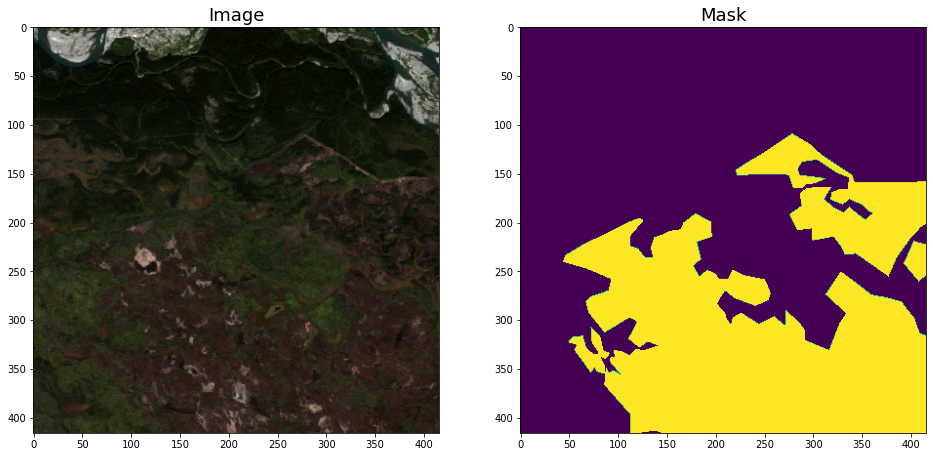

In [48]:
image_noaugment, mask_noaugment = dataset_noaugment[0]
visualize(image_noaugment, mask_noaugment[:,:,0], in_rows=True)

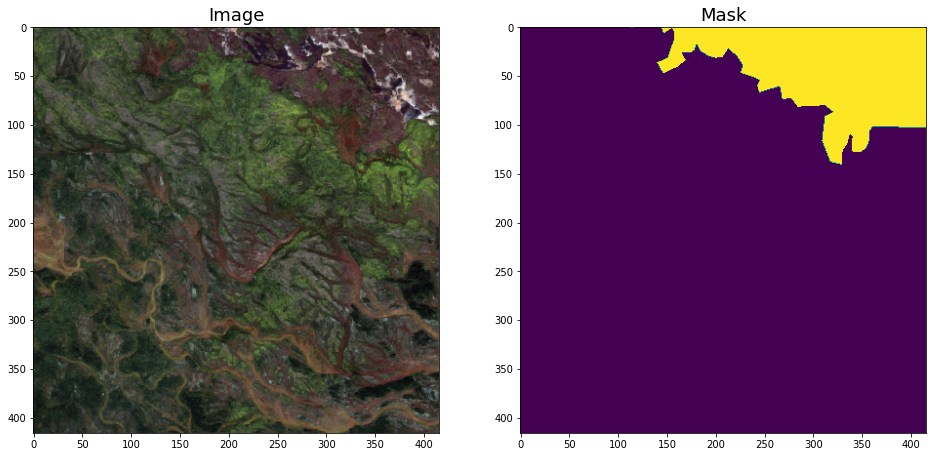

In [49]:
image_noaugment, mask_noaugment = dataset_noaugment[3]
visualize(image_noaugment, mask_noaugment[:,:,0], in_rows=True)

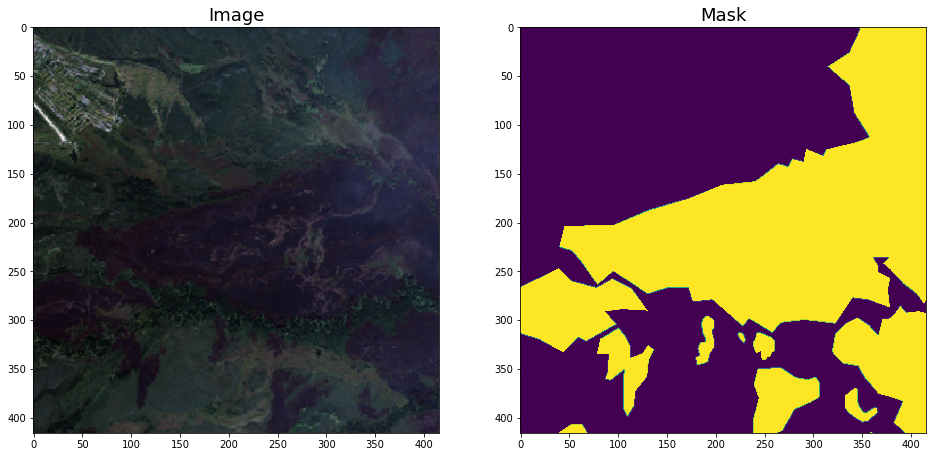

In [50]:
image_noaugment, mask_noaugment = dataset_noaugment[30]
visualize(image_noaugment, mask_noaugment[:,:,0], in_rows=True)

Now, visualise an example from the dataset with augmentations, repeating a few times to see the random augmentations applied:

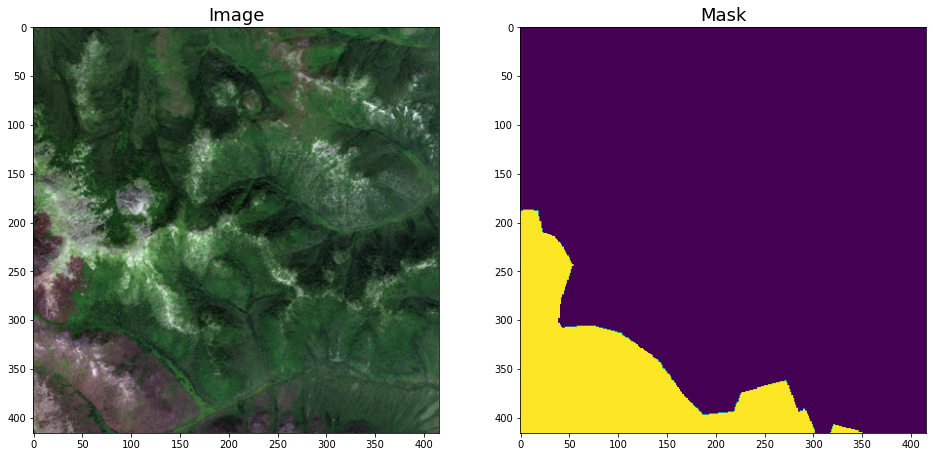

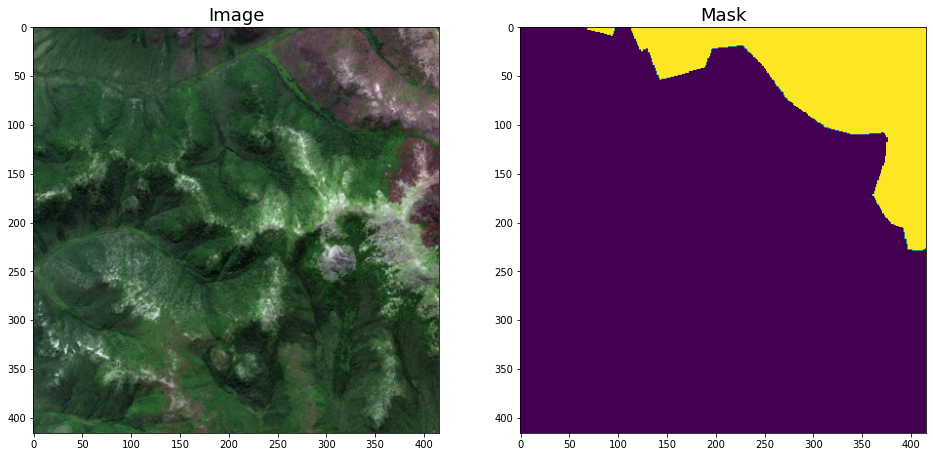

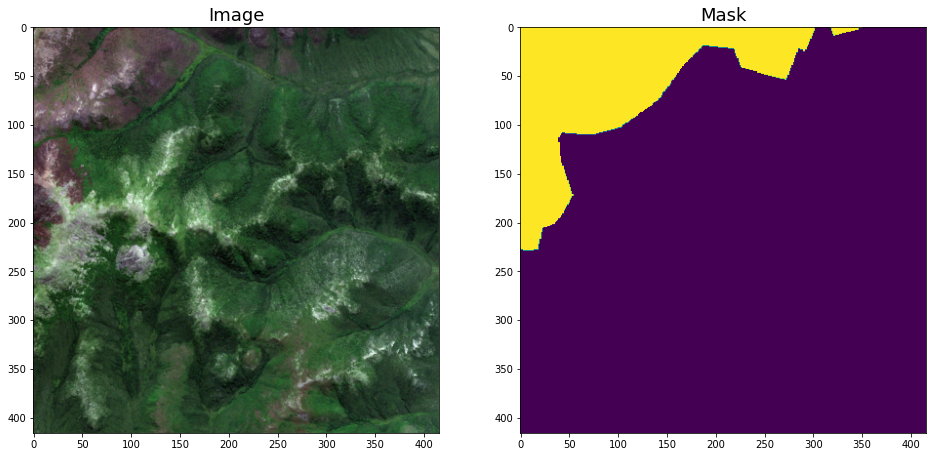

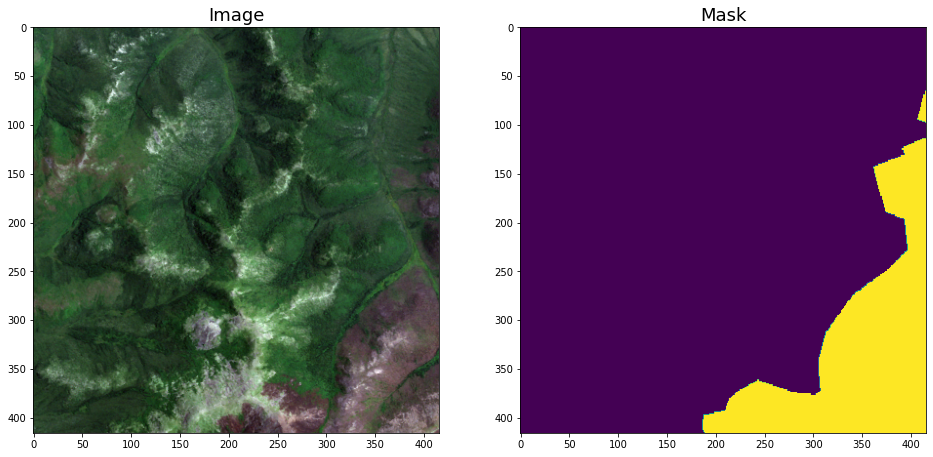

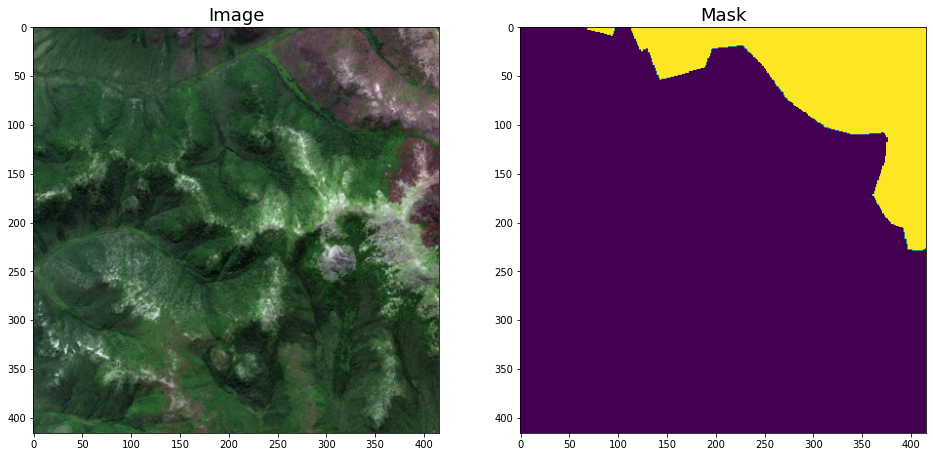

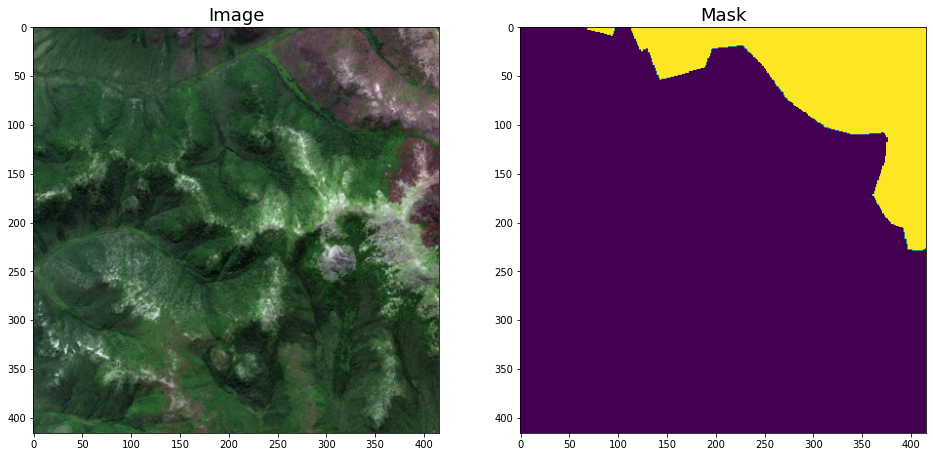

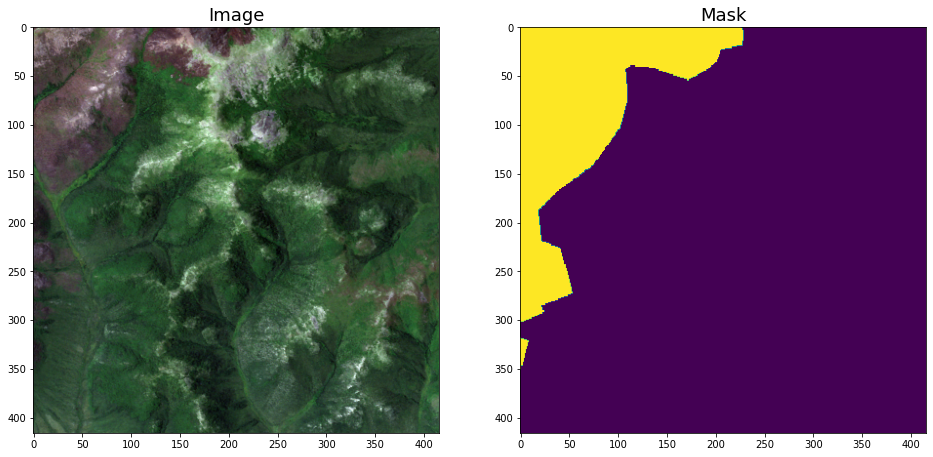

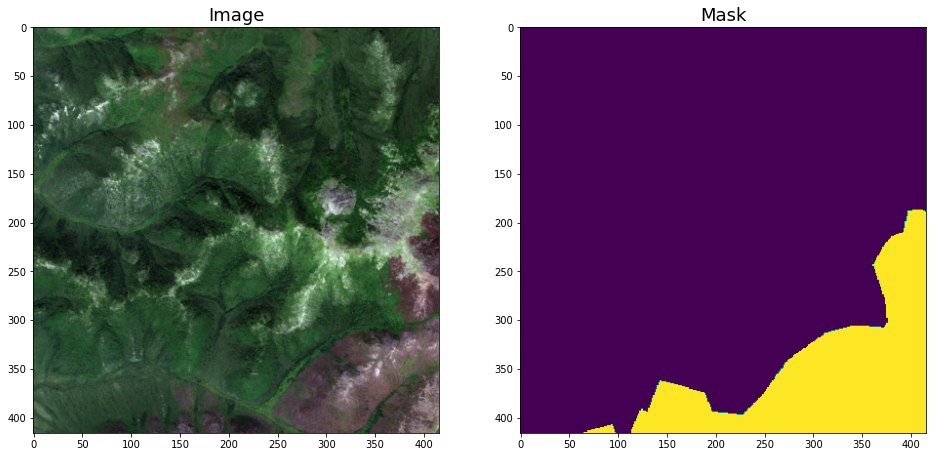

In [51]:
for i in range(8):
    image_augmented, mask_augmented = dataset_augmented[20]
    visualize(image_augmented, mask_augmented[:,:,0], in_rows=True)

### Applying `random_split` to the full dataset to get train/validate/test sets

First, define the helper to split the dataset

In [52]:
def random_data_split(dataset, split_fractions=(0.7, 0.2, 0.1)):
    """Split dataset into training, validation, and (optionally) test sets.
    
    Parameters
    ----------
    dataset : torch.utils.data.Dataset (or its subclass) instance
        The dataset to be split.
    split_fractions : list or tuple of floats
        The fraction (1 is the complete dataset) to split into training,
        validation, and test datasets. If only two values are given, the
        given `dataset` will be split into training and validation sets 
        only. The default is (0.7, 0.2, 0.1).
        
    Returns
    -------
    list of torch.utils.data.Subset instances
        Either `[train_set, valid_set, test_set]` or `[train_set, valid_set]`.
    
    """
    dataset_size = len(dataset)
    print(f"Available data size:      {dataset_size:7d}\n")
    
    # List of datasets (to be populated)
    setlist = []
    
    train_size = int(dataset_size * split_fractions[0])
    
    if len(split_fractions) == 3:
        valid_size = int(dataset_size * split_fractions[1])
        test_size = dataset_size - train_size - valid_size
        
        # Split out test set from the rest
        trainvalid_set, test_set = random_split(dataset, [train_size + valid_size, test_size])
        
        # Add to test set to the set list
        setlist = [test_set]
    else:
        valid_size = dataset_size - train_size
        trainvalid_set = dataset
        test_set = []  # Dummy item with length 0 for summing below
    
    # Split the rest or the full dataset into training and validation sets
    train_set, valid_set = random_split(trainvalid_set, [train_size, valid_size])
    
    # Prepend the training and validation sets to the set list
    setlist.insert(0, valid_set)
    setlist.insert(0, train_set)
    
    print("Split into")    
    print(f"Training set with size:   {len(train_set):7d}")
    print(f"Validation set with size: {len(valid_set):7d}")
    print(f"Testing set with size:    {len(test_set):7d}")
    print("--------------------------")
    print(f"Total (for verification): {len(train_set) + len(valid_set) + len(test_set):7d}\n")
    
    return setlist

Using the no-augmentation dataset defined before, split them using our helper method:

In [53]:
# Default split is used to have a good number of images for validation as the dataset is small
train_subset, valid_subset, test_subset = random_data_split(dataset_noaugment, (0.7, 0.2, 0.1))

Available data size:           75

Split into
Training set with size:        52
Validation set with size:      15
Testing set with size:          8
--------------------------
Total (for verification):      75



Wrap the split subsets (now `torch.utils.data.dataset.Subset` instances) with the "Subset" class defined at the beginning:

**Note**  
Since our data are not standard 3-channel images, we omit the preprocessing, since we cannot use the pretrained weights anyway.

In [54]:
train_set = ArcticWaterSubset(
    train_subset,
    augmentations=get_training_augmentations(original_height=ORIGINAL_HEIGHT, 
                                             original_width=ORIGINAL_WIDTH, 
                                             n=5),
    preprocessing=get_preprocessing()
)

valid_set = ArcticWaterSubset(
    valid_subset,
    augmentations=get_validation_augmentations(original_height=ORIGINAL_HEIGHT, 
                                               original_width=ORIGINAL_WIDTH, 
                                               n=5),
    preprocessing=get_preprocessing()
)

test_set = ArcticWaterSubset(
    test_subset,
    augmentations=get_test_augmentations(original_height=ORIGINAL_HEIGHT, 
                                         original_width=ORIGINAL_WIDTH, 
                                         n=5),
    preprocessing=get_preprocessing()
)

### Check the split datasets

Check the training data to see that augmentations are functioning as expected:

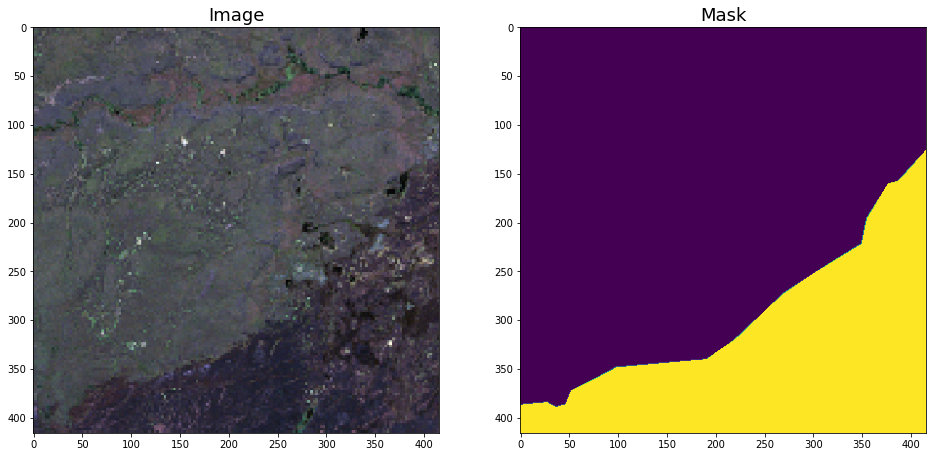

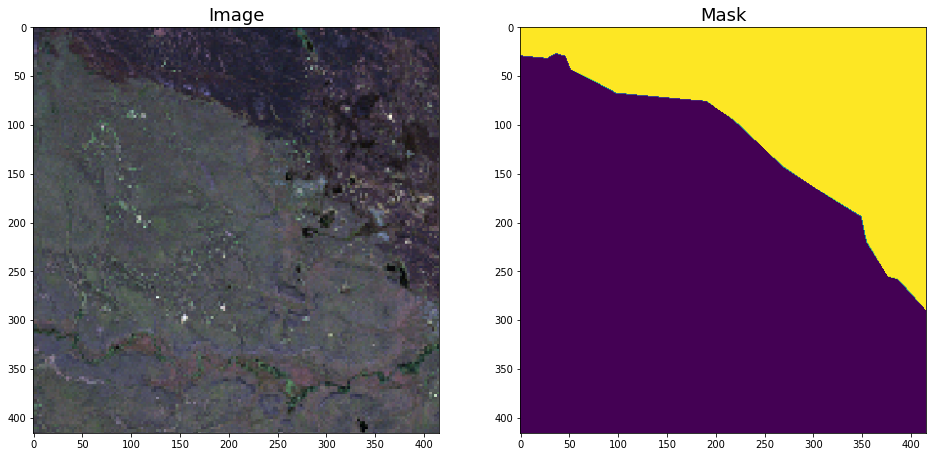

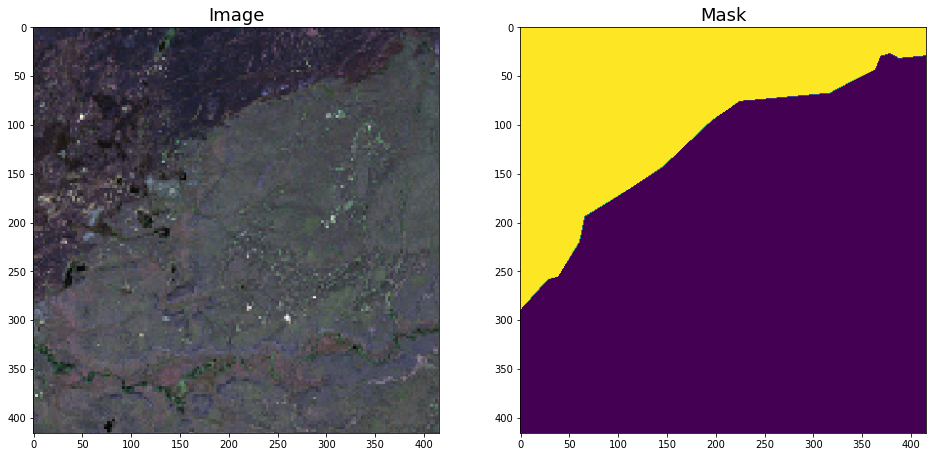

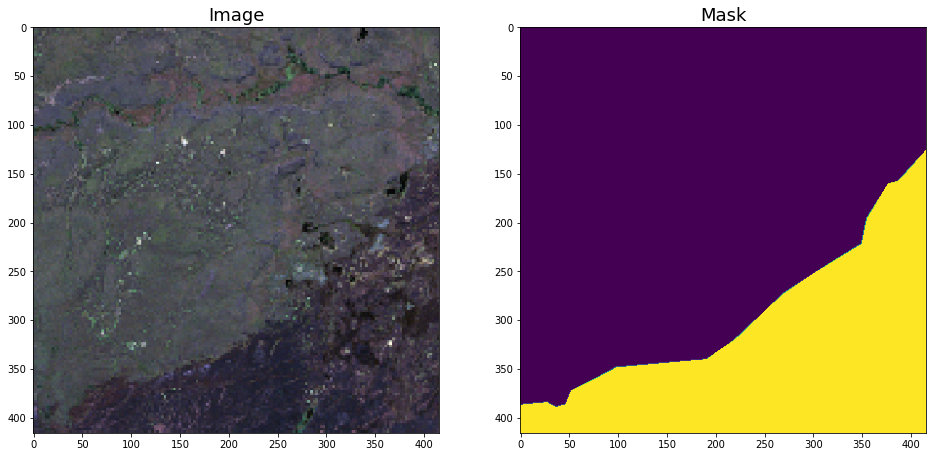

In [59]:
for i in range(4):
    image_train, mask_train = train_set[2]
    visualize(reshape_as_image(image_train.numpy()), reshape_as_image(mask_train.numpy())[:,:,0], in_rows=True)


Check the validation and test datasets to ensure that no randomised augmentations are applied:

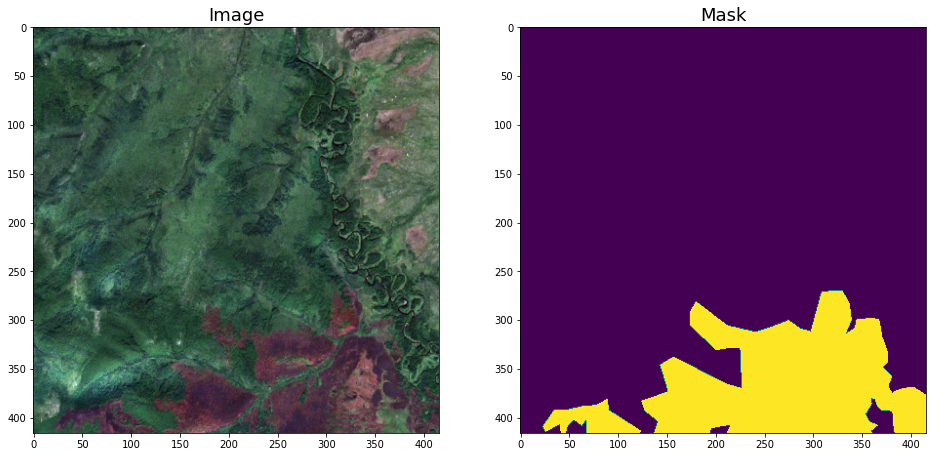

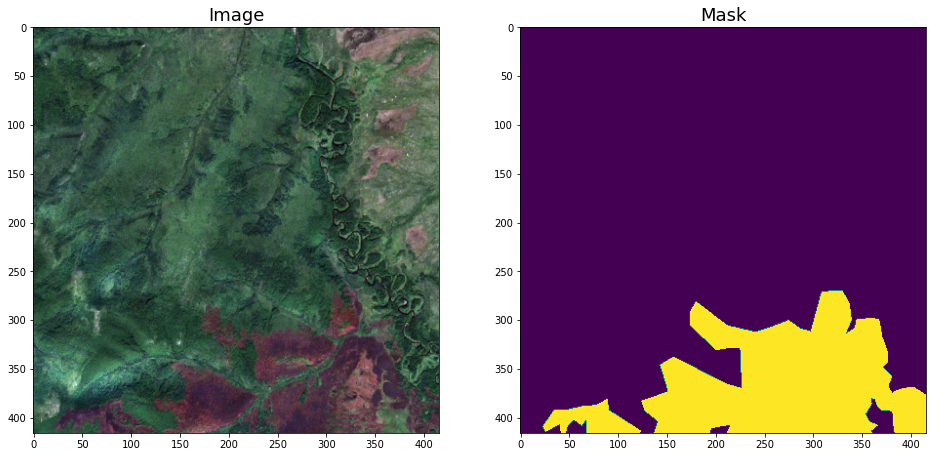

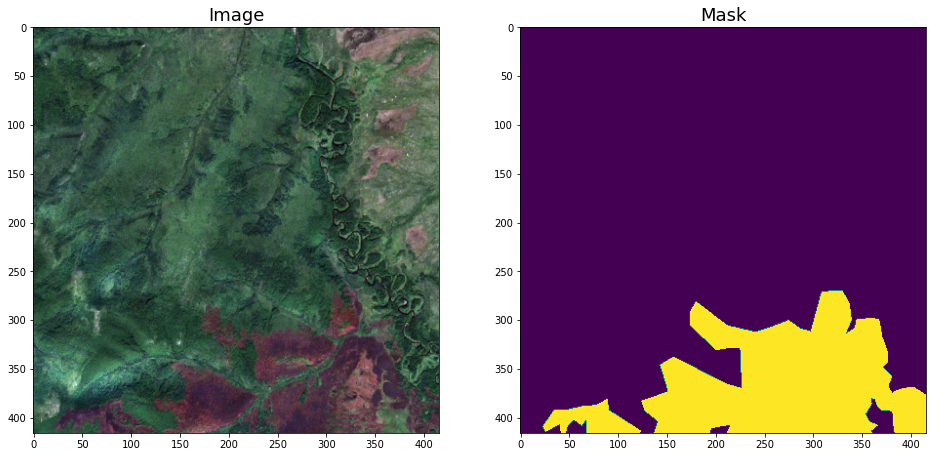

In [60]:
# Do it 3 times to show no augmentations
for i in range(3):
    image_valid, mask_valid = valid_set[4]
    visualize(reshape_as_image(image_valid.numpy()), reshape_as_image(mask_valid.numpy())[:,:,0], in_rows=True)

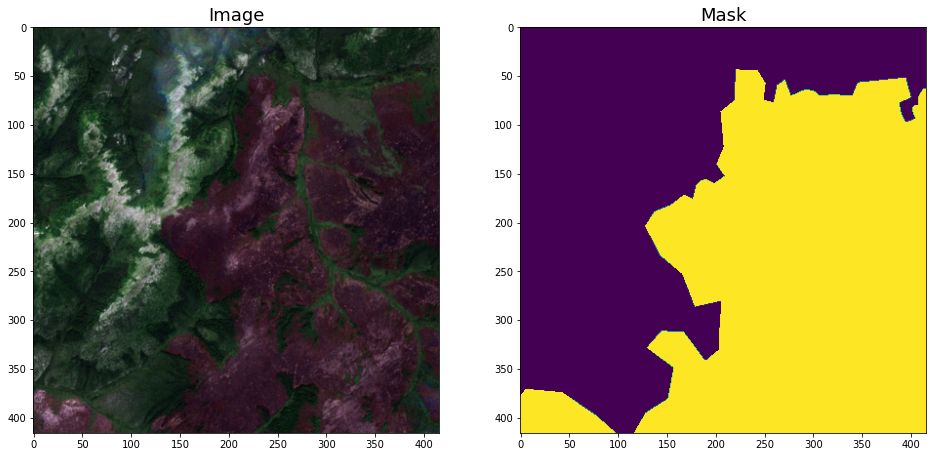

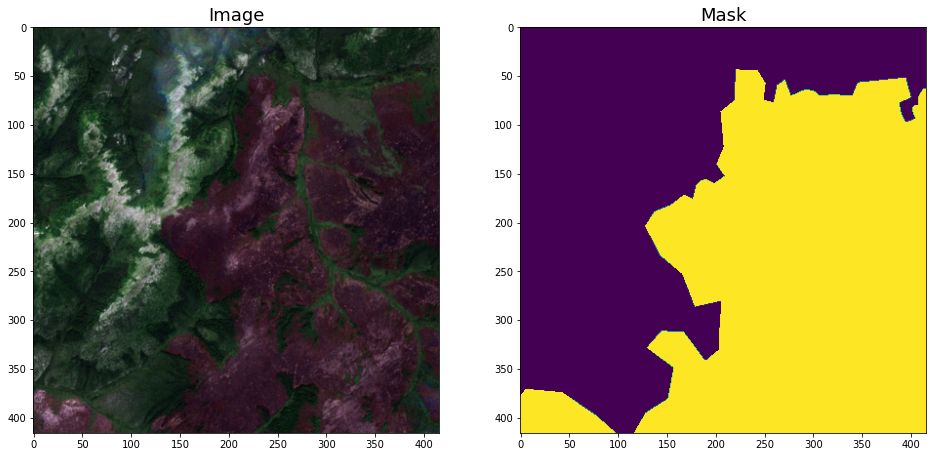

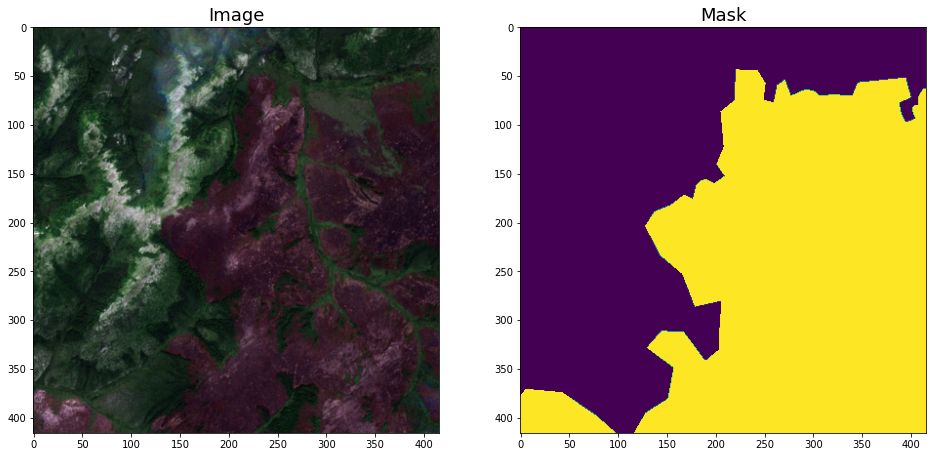

In [61]:
# Do it 3 times to show no augmentations
for i in range(3):
    image_test, mask_test = test_set[0]
    visualize(reshape_as_image(image_test.numpy()), reshape_as_image(mask_test.numpy())[:,:,0], in_rows=True)

## Training Trial Run

Set up the model:

In [62]:
# After numerous trials of different encoders `resnet101` has been chosen as giving the best results 
ENCODER = 'resnet101' 
ENCODER_WEIGHTS = 'imagenet'

model = smp.UnetPlusPlus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS,     
    in_channels=6,
    classes=1,
    activation='sigmoid' #for multiclass segmentation ('sigmoid' for binary segmentation)
)

Set up the `DataLoader` instances:

In [63]:
train_loader = DataLoader(train_set, batch_size=2, shuffle=True)
valid_loader = DataLoader(valid_set, batch_size=1, shuffle=False)

#### Final check of training and validation datasets before training the model

In [64]:
image_t, mask_t = next(iter(train_loader))
image_v, mask_v = next(iter(valid_loader))
print(f'training image = shape: {image_t.shape}; type: {image_t.dtype}')
print(f'training mask = shape: {mask_t.shape};  type: {mask_t.dtype}')
print(f'validation image = shape: {image_v.shape}; type: {image_v.dtype}')
print(f'validation mask = shape: {mask_v.shape}; type: {mask_v.dtype}')


print(f'length of training dataset: {len(train_set)}')
print(f'length of validation dataset: {len(valid_set)}')
print(f'length of test dataset: {len(test_set)}')

training image = shape: torch.Size([2, 6, 416, 416]); type: torch.float32
training mask = shape: torch.Size([2, 1, 416, 416]);  type: torch.float32
validation image = shape: torch.Size([1, 6, 416, 416]); type: torch.float32
validation mask = shape: torch.Size([1, 1, 416, 416]); type: torch.float32
length of training dataset: 52
length of validation dataset: 15
length of test dataset: 8


Define the loss functions, performance metrics, and training/validation steps:

**Note**  
For speed and convenience, using the example from [this notebook](https://github.com/qubvel/segmentation_models.pytorch/blob/master/examples/cars%20segmentation%20(camvid).ipynb) 
to get some training loop going for this trial purpose. 

**Side Note**  
The `device` (in the setup of `*_epoch` runners below) and `num_workers` (in the `DataLoader` setup above) arguments are omitted when run on a small laptop without dedicated GPU.

In [65]:
# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index

loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [66]:
# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    verbose=True,
    device=DEVICE
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    verbose=True,
    device=DEVICE,
)

In [67]:
DEVICE

device(type='cuda', index=0)

**Train!!**

In [68]:
# train model for 40 epochs

max_score = 0

for i in range(0, 10):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        print('Model saved!')
        
    if i == 25:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')


Epoch: 0
valid: 100%|██████████| 15/15 [00:01<00:00,  9.66it/s, dice_loss - 0.3318, iou_score - 0.7513]
Model saved!

Epoch: 1
valid: 100%|██████████| 15/15 [00:01<00:00,  9.45it/s, dice_loss - 0.2878, iou_score - 0.8474]
Model saved!

Epoch: 2
valid: 100%|██████████| 15/15 [00:01<00:00,  9.76it/s, dice_loss - 0.2921, iou_score - 0.7665]

Epoch: 3
valid: 100%|██████████| 15/15 [00:01<00:00,  9.87it/s, dice_loss - 0.2904, iou_score - 0.7051]

Epoch: 4
valid: 100%|██████████| 15/15 [00:01<00:00,  9.59it/s, dice_loss - 0.3377, iou_score - 0.6436]

Epoch: 5
valid: 100%|██████████| 15/15 [00:01<00:00,  8.76it/s, dice_loss - 0.1818, iou_score - 0.869]
Model saved!

Epoch: 6
valid: 100%|██████████| 15/15 [00:01<00:00,  9.67it/s, dice_loss - 0.1634, iou_score - 0.8854]
Model saved!

Epoch: 7
valid: 100%|██████████| 15/15 [00:01<00:00,  9.61it/s, dice_loss - 0.1978, iou_score - 0.8377]

Epoch: 8
valid: 100%|██████████| 15/15 [00:01<00:00,  9.86it/s, dice_loss - 0.1484, iou_score - 0.8951]
Mode

## Testing Trial Model

**Note**  
Again, following mostly [this notebook](https://github.com/qubvel/segmentation_models.pytorch/blob/master/examples/cars%20segmentation%20(camvid).ipynb) for the purpose of this trial.

Load back the best model saved during checkpointing:

In [69]:
best_model = torch.load("./best_model.pth")

Use the `test_set` created above to evaluate the model by first setting up the `DataLoader` instance:

In [70]:
test_loader = DataLoader(test_set)

Then, we define the testing step:

In [71]:
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics
)

Finally, run the testing steps:

In [72]:
logs = test_epoch.run(test_loader)

valid: 100%|██████████| 8/8 [00:36<00:00,  4.54s/it, dice_loss - 0.2017, iou_score - 0.8419]


## Visualising the Predictions

Create an augmentation to undo the padding done to satisfy model-imput requirements:

In [73]:
unpad = A.CenterCrop(height=ORIGINAL_HEIGHT, width=ORIGINAL_WIDTH, p=1)

Draw multiple random sample from the test data, make predictions from the best model, and visualise:

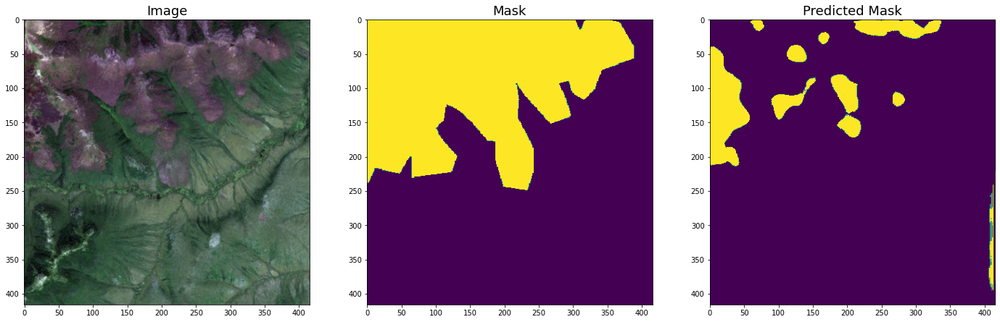

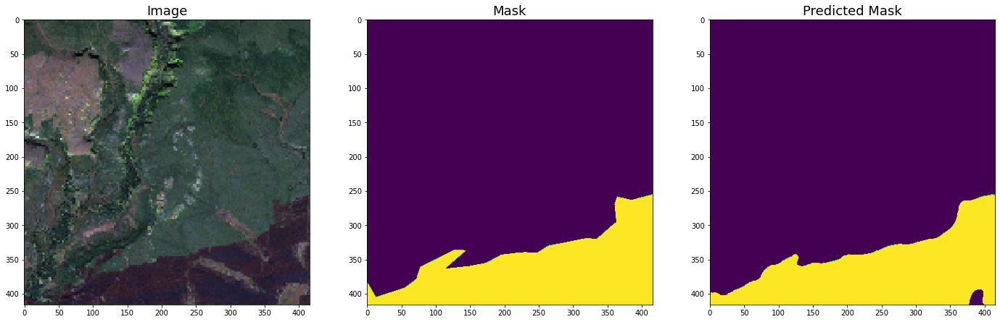

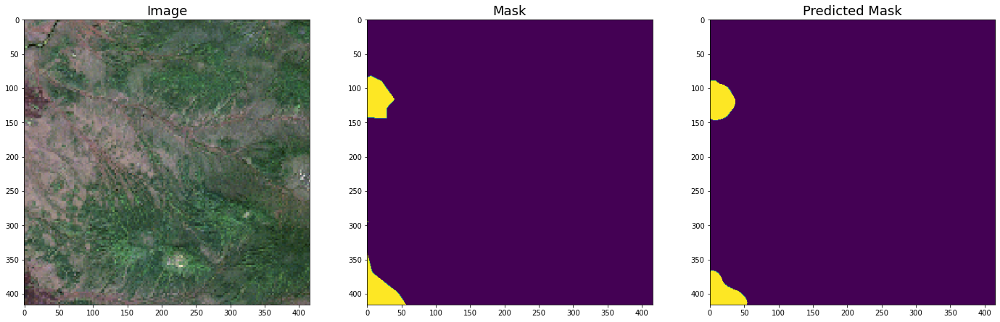

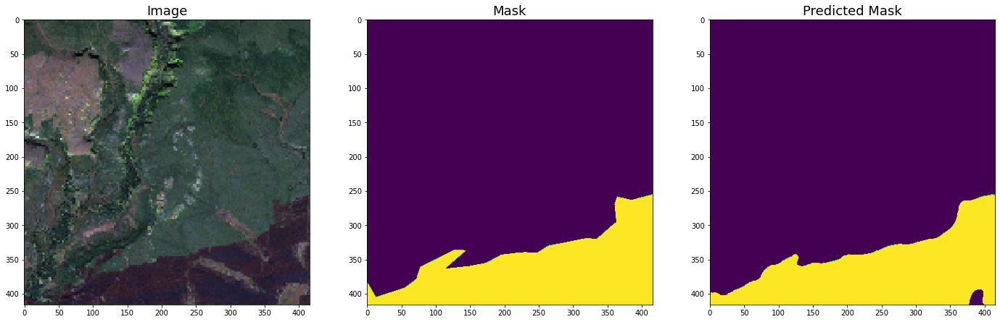

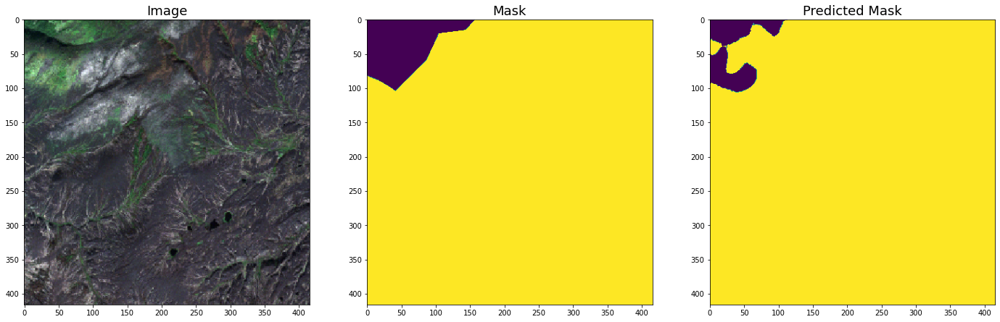

...

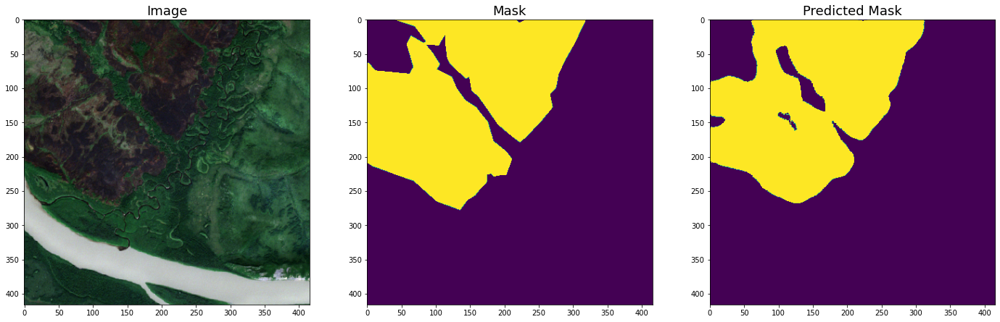

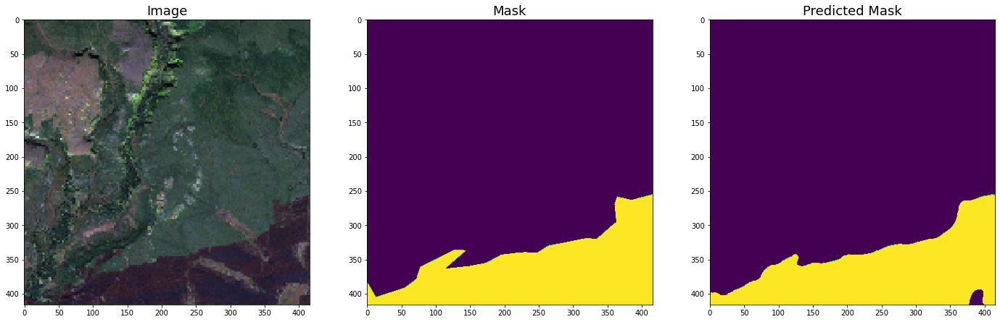

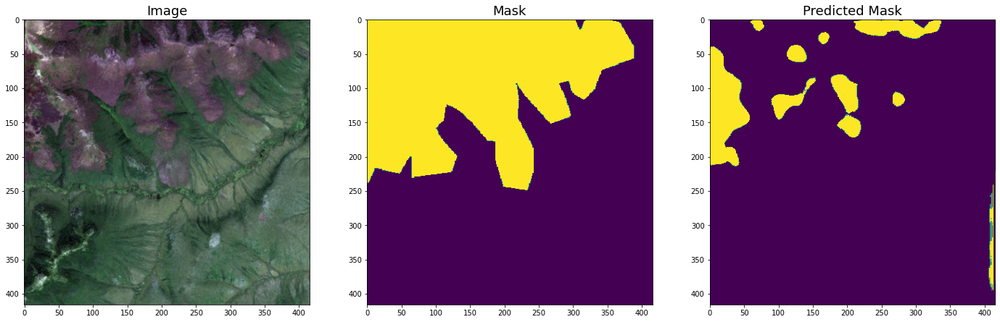

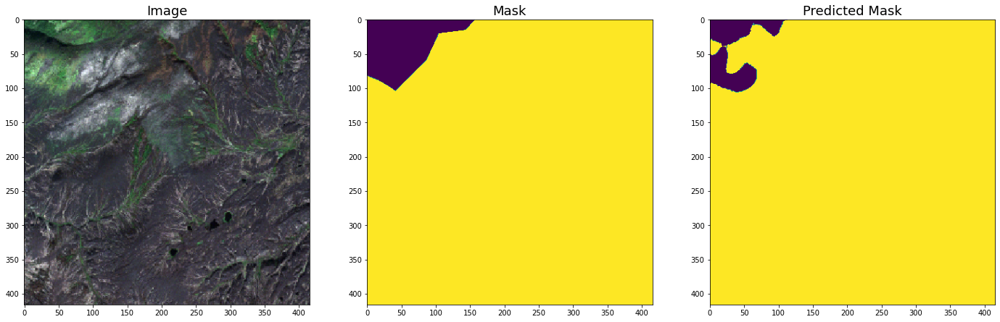

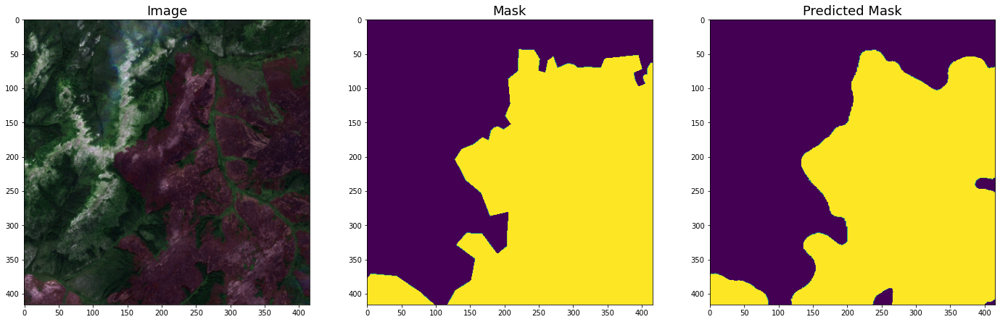

In [76]:
for i in range(20):
    idx = np.random.choice(len(test_set))
    
    image_padded, mask_padded = test_set[idx]
    
    predicted_mask_padded = best_model.predict(image_padded.unsqueeze(0)).squeeze(0)
    # Unsqueeze to get the batch dimension
    # Then squeeze to get rid of the batch dimension
    
    unpadded = unpad(
        image=reshape_as_image(image_padded.numpy()), 
        mask=reshape_as_image(mask_padded.numpy()),
    )
    unpadded_p = unpad(
        image=reshape_as_image(image_padded.numpy()), 
        mask=reshape_as_image(predicted_mask_padded.numpy())
    )
    
    image = unpadded['image']
    mask = unpadded['mask']
    predicted_mask = unpadded_p['mask']
    
    visualize(
        image=image,
        mask=mask[:,:,0],
        predicted_mask=predicted_mask.round()[:,:,0],
        in_rows=True
    )